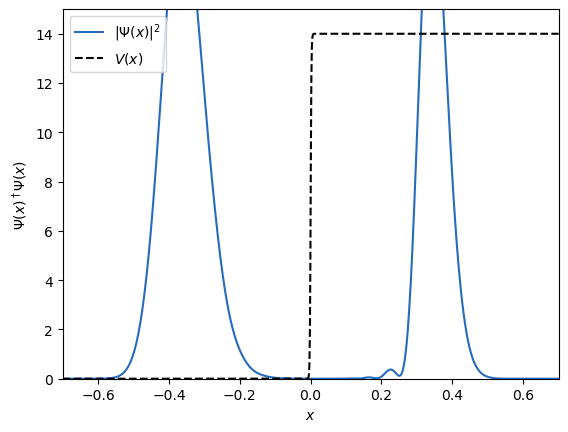

In [19]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Define the (smooth) step potential
# V(x)=0.5*V0*(tanh(x/w)+1)
def V(x, V0, w):
    return V0*0.5*(np.tanh(x/w)+1)

# Define computational grid
N = 1024
x_domain = [-0.7, 0.7]

dx = (x_domain[1] - x_domain[0]) / (N-1)     # spatial step size
x = np.linspace(x_domain[0], x_domain[1], N) # spatial grid points

c = 137                 # speed of light in atomic units (h=e=m_e=1)
dt = 1.0 / (4*c**2)     # temporal step size

dp = 2.0*np.pi / (N*dx)             # momentum step size
p = np.linspace(0, (N-1)*dp, N)     # momentum grid points
p[p>0.5*N*dp] -= N*dp               # imposing periodicity
# p = np.sort(p)

# Initial wave packet
m = 1.0     # to be changed to mass of a spin-0 particle
E = np.sqrt(p**2*c**2 + (m**2*c**4))
H_11 = 0.5*p**2/m + m*c**2

# Gaussian wave packet with p_mean composed of positive-energy states
x_init = -0.2               # initial position of the wave packet
p_mean = 106.4              # mean momentum
Delta_p = 0.125*c           # momentum width
Psi = np.zeros((2,N), dtype='complex')
Psi[0, :] = 1
Psi[1, :] = -p**2 / (2*m*E + 2*m*H_11)
Psi *= np.sqrt(0.5*(E+H_11)/H_11) # normalize
g = 1 / (2*np.pi*Delta_p**2)**0.25 * np.exp(-(p-p_mean)**2 / (4*Delta_p**2)) * np.exp(- 1j*p*x_init)
Psi *= g    # multiply with weight function

# go to real space
Psi = dp / np.sqrt(2*np.pi) * np.exp(1j*x*p[0]) * np.fft.ifft(np.exp(1j*x[0]*np.arange(0, N)*dp)*Psi, axis=1)*N

# real space propagator
U_1 = np.exp(-0.5*1j*V(x, 2*c**2+1e4, 0.3/c)*dt)

# construct the free propagator
U_2 = np.zeros((2, 2, N), dtype='complex')
for i in range(0, N):
    Q = np.array([ [1, -p[i]**2/(2*m*E[i]+2*m*H_11[i])], [-p[i]**2/(2*m*E[i]+2*m*H_11[i]), 1] ])
    Q_inv = np.array([ [1, p[i]**2/(2*m*E[i]+2*m*H_11[i])], [p[i]**2/(2*m*E[i]+2*m*H_11[i]), 1] ])
    Q_inv *= 0.5*(E[i]+H_11[i])/E[i]
    U_2[:, :, i] = np.dot(Q, np.dot(np.diag([np.exp(-1j*dt*E[i]), np.exp(+1j*dt*E[i])]), Q_inv))

# Define the potential barrier
V0 = 2 *c**2 + 1e4  # potential height
w = 0.3 / c          # potential width
V_x = V(x, V0, w)    # compute potential function

# Normalize V(x) for visualization (scaling factor for visibility)
V_x = V_x / np.max(V_x) * 14  # Scale to be within (0,5) for plotting

# Set up the figure and axis
fig, ax = plt.subplots()
ax.set_xlim(x_domain[0], x_domain[1])
ax.set_ylim(0, 15)
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$\Psi(x)^\dagger\Psi(x)$')

# Plot elements
line_prob, = ax.plot([], [], color="#266bbd", label=r'$|\Psi(x)|^2$')
ax.plot(x, V_x, color='black', linestyle='--', label=r'$V(x)$') # potential barrier
ax.legend(loc='upper left')

# Initialization function
def init():
    line_prob.set_data([], [])
    return line_prob,

# Update function
def update(frame):
    global Psi
    Psi *= U_1                                      # apply U_1 in real space
    Psi = np.fft.fft(Psi, axis=1)                   # go to Fourier space
    Psi = np.einsum('ij...,j...->i...', U_2, Psi)   # apply U_2 in Fourier space
    Psi = np.fft.ifft(Psi, axis=1)                  # go to real space
    Psi *= U_1                                      # apply U_1 in real space

    line_prob.set_data(x, Psi[0,:].real**2 + Psi[0,:].imag**2 + Psi[1,:].real**2 + Psi[1,:].imag**2)

    return line_prob,

# Create animation
ani = animation.FuncAnimation(fig, update, frames=512, init_func=init, blit=True)

# Show the animation
# plt.show()
HTML(ani.to_jshtml())